### Import libraries

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

import seaborn as sns
from  datetime import datetime
from scipy.stats import ttest_ind
import os
%matplotlib inline

metrics = [1,2,3,4,5,6,7,8,9,10,13,15,16,19,20]

## Evolution of the samples
Now we see the evolution of each metric in each experiment, graphing the 4 compounds.

In [18]:
df_compounds = pd.read_excel('data/Nombre de los productos.xlsx', index_col=0)
df_compounds = df_compounds[df_compounds.index.notnull()]
# To be able to see what happen with th control group it will be usefull to map the metric and the component
dict_compounds = df_compounds.to_dict(orient='index')

In [19]:
df = pd.read_csv('data/metrics_1.csv')
columns_names =  set(df.columns)
# remove the cycle, time, well and object index
columns_names.remove("Well")
columns_names.remove("Time")
columns_names.remove("Cycle")
columns_names.remove("Object Index")

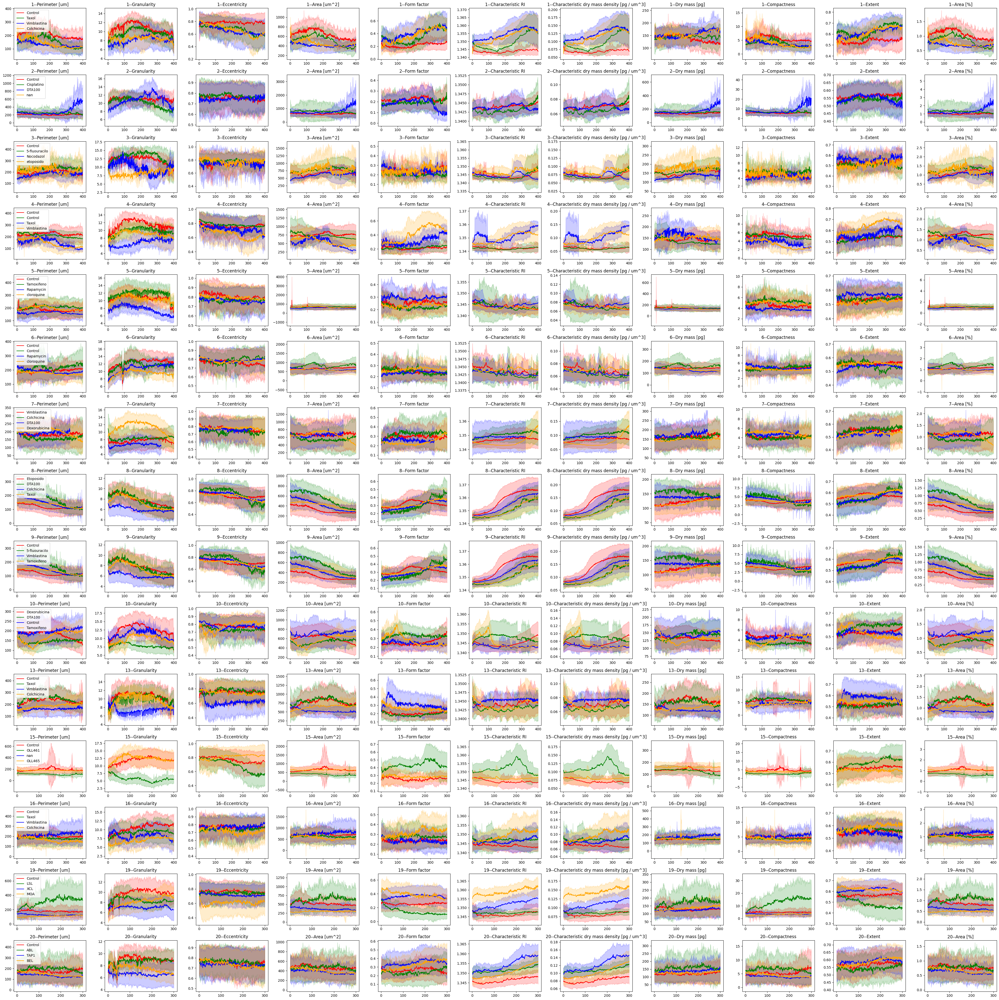

In [20]:
fig, axs = plt.subplots(len(metrics), len(columns_names),figsize=(40,40))

for col_ind, col in enumerate(columns_names):
    for row_met, metric in enumerate(metrics):
        file = f'data/metrics_{metric}.csv'
        df = pd.read_csv(file)

        for i,(well_,color_) in enumerate(zip(['A1','A2','B1','B2'],['r','g','b','orange'])):
            # do the mean of the area where the cycle is the same
            mask = df['Well'] == well_
            cycle_serie = df['Cycle'][mask]
            
            cycle = cycle_serie.unique()
            metric_mean = df[col][mask].groupby(cycle_serie).mean()
            metric_std = df[col][mask].groupby(cycle_serie).std()

            axs[row_met, col_ind].plot(cycle,metric_mean, color=color_, label=dict_compounds[metric][i+1])
            axs[row_met, col_ind].fill_between(cycle, metric_mean - metric_std, metric_mean + metric_std, color=color_, alpha=0.2)
            

        axs[row_met, col_ind].set_title(f'{metric}--{col}')
        if col_ind==0:
            axs[row_met, col_ind].legend(loc='upper left')
        # axs[row_met, col_ind].grid()
        # print(f"plotting {row_met} {col_ind}")
        
plt.tight_layout()
plt.show()  

Para que algunos datos son iguales, pero esto lo podemos confirmar calculadno la correlacion entre ellos

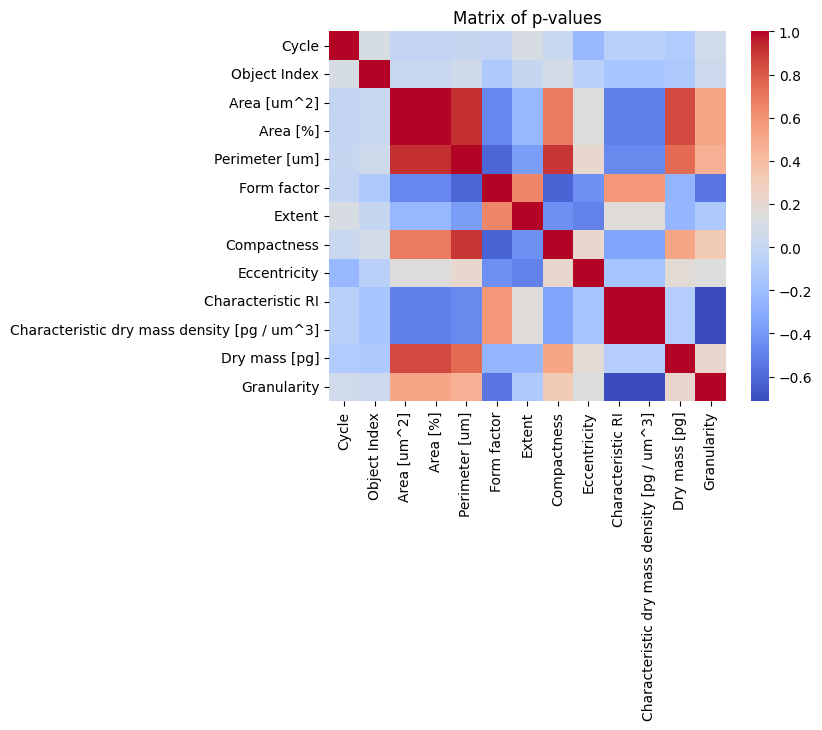

,Cycle,Object Index,Area [um^2],Area [%],Perimeter [um],Form factor,Extent,Compactness,Eccentricity,Characteristic RI,Characteristic dry mass density [pg / um^3],Dry mass [pg],Granularity
Cycle,1.000000,0.103111,-0.005331,-0.005331,0.009301,-0.006182,0.109829,0.025589,-0.225843,-0.064621,-0.064620,-0.108400,0.061241
Object Index,0.103111,1.000000,0.016154,0.016154,0.052848,-0.127965,0.009064,0.076714,-0.057882,-0.156772,-0.156771,-0.128855,0.036617
Area [um^2],-0.005331,0.016154,1.000000,1.000000,0.919747,-0.477846,-0.235339,0.689285,0.152917,-0.499621,-0.499621,0.856528,0.519827
Area [%],-0.005331,0.016154,1.000000,1.000000,0.919747,-0.477846,-0.235339,0.689285,0.152917,-0.499621,-0.499621,0.856528,0.519827
Perimeter [um],0.009301,0.052848,0.919747,0.919747,1.000000,-0.607223,-0.373498,0.912954,0.212109,-0.459916,-0.459914,0.749273,0.465996
Form factor,-0.006182,-0.127965,-0.477846,-0.477846,-0.607223,1.000000,0.650034,-0.617501,-0.435797,0.579196,0.579197,-0.257560,-0.547477
Extent,0.109829,0.009064,-0.235339,-0.235339,-0.373498,0.650034,1.000000,-0.433131,-0.497775,0.160572,0.160571,-0.238798,-0.121665
Compactness,0.025589,0.076714,0.689285,0.689285,0.912954,-0.617501,-0.433131,1.000000,0.215425,-0.341756,-0.341753,0.521977,0.316508
Eccentricity,-0.225843,-0.057882,0.152917,0.152917,0.212109,-0.435797,-0.497775,0.215425,1.000000,-0.158115,-0.158118,0.177464,0.139962
Characteristic RI,-0.064621,-0.156772,-0.499621,-0.499621,-0.459916,0.579196,0.160572,-0.341756,-0.158115,1.000000,1.000000,-0.086808,-0.713138


In [21]:
file = f'data/metrics_{15}.csv'
df = pd.read_csv(file)
del df["Well"]
del df["Time"]

sns.heatmap(df.corr(), cmap='coolwarm', xticklabels=df.columns, yticklabels=df.columns)
plt.title('Matrix of p-values')
plt.show()
df.corr()

## Analize how each compound affects the cells
Now we make the plot by compound and by metric instead of by experiment


In [22]:
path = 'data/all_metrics.csv'
df_all = pd.read_csv(path,index_col=0)
df_all

,Well,Cycle,Time,Object Index,Area [um^2],Area [%],Perimeter [um],Form factor,Extent,Compactness,Eccentricity,Characteristic RI,Characteristic dry mass density [pg / um^3],Dry mass [pg],Granularity,Metric,Wellc,Compound,Target
0,A1,1,00:00:20,1,471.48,0.776572,275.3940,0.078120,0.425646,12.80080,0.735266,1.34773,0.088648,133.7470,5.86423,1,A1c,Control,0
1,A1,1,00:00:20,2,408.56,0.672937,139.5090,0.263790,0.525547,3.79089,0.847883,1.34878,0.093876,122.7330,7.12153,1,A1c,Control,0
2,A1,1,00:00:20,3,737.20,1.214240,354.5060,0.073714,0.398504,13.56600,0.910670,1.34362,0.068090,160.6280,9.07188,1,A1c,Control,0
3,A1,1,00:00:20,4,495.96,0.816893,166.9360,0.223645,0.403220,4.47138,0.925866,1.34592,0.079605,126.3390,6.13479,1,A1c,Control,0
4,A1,1,00:00:20,5,483.96,0.797128,169.2730,0.212248,0.616196,4.71146,0.779687,1.34906,0.095314,147.6090,7.78636,1,A1c,Control,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98547,B2,300,15:05:29,85,233.32,0.384300,93.0276,0.338796,0.493611,2.95163,0.859475,1.34889,0.094442,70.5127,7.83123,20,B2c,BEL,4
98548,B2,300,15:05:29,86,216.52,0.356629,64.0441,0.663361,0.665478,1.50747,0.639039,1.35986,0.149281,103.4310,7.49048,20,B2c,BEL,4
98549,B2,300,15:05:29,87,177.48,0.292326,72.0144,0.430051,0.584585,2.32530,0.910359,1.36513,0.175652,99.7590,4.96674,20,B2c,BEL,4
98550,B2,300,15:05:29,88,262.64,0.432593,87.9281,0.426889,0.667276,2.34253,0.737718,1.34972,0.098584,82.8548,8.61766,20,B2c,BEL,4


plot each metric for all the metrics

In [23]:
df_all = df_all[df_all['Target'] != 4]
measures = list(df_all.columns)
measures.remove('Well')
measures.remove('Wellc')
measures.remove('Cycle')
measures.remove('Time')
measures.remove('Object Index')
measures.remove('Metric')
measures.remove('Compound')
# measures.remove('Well Target')
measures.remove('Target')
print(df_all.shape, measures)

(840151, 19) ['Area [um^2]', 'Area [%]', 'Perimeter [um]', 'Form factor', 'Extent', 'Compactness', 'Eccentricity', 'Characteristic RI', 'Characteristic dry mass density [pg / um^3]', 'Dry mass [pg]', 'Granularity']


Lo primero que tenemos que ver es si hay diferencia entre los diferentes target.

XXX Esto también se les puede mostrar y que esperarían ver ellos.

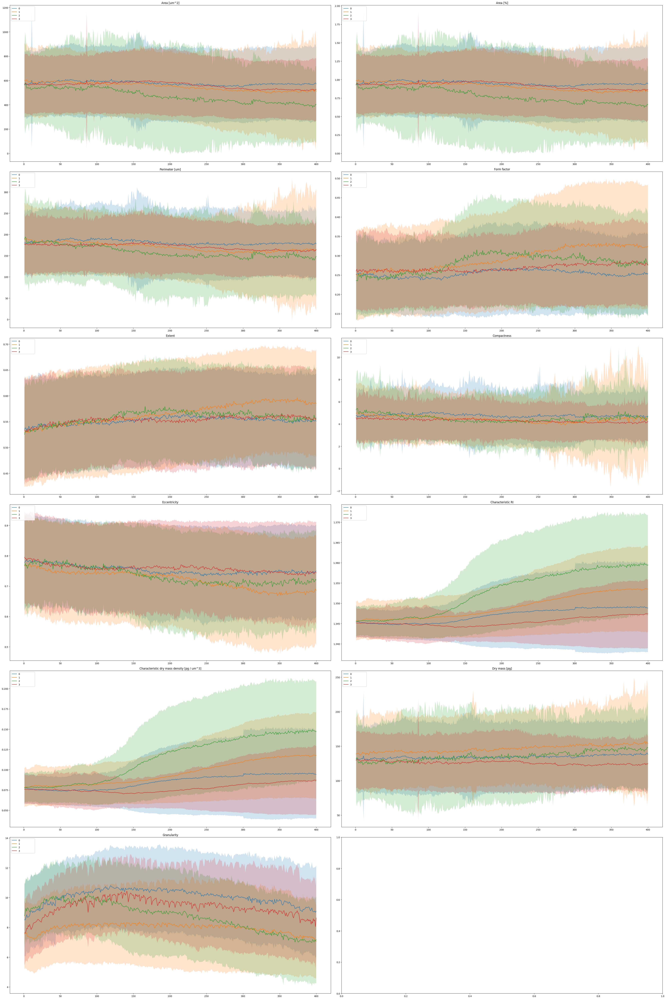

In [24]:
fig, axs = plt.subplots(len(measures)//2+1, 2,figsize=(40,60))

for i_measeure,measure_ in enumerate(measures):
    row_ = i_measeure//2
    col_ = int(np.ceil(i_measeure/2-row_))

    for compound in set(df_all['Target']):
        
        cycle = df_all['Cycle'][df_all['Target'] == compound].unique()
        metric_mean = df_all[measure_][df_all['Target'] == compound].groupby(df_all['Cycle'][df_all['Target'] == compound]).mean()
        metric_std = df_all[measure_][df_all['Target'] == compound].groupby(df_all['Cycle'][df_all['Target'] == compound]).std()
                
        axs[row_,col_].plot(cycle,metric_mean,label=f"{compound:<20}")
        axs[row_,col_].fill_between(cycle, metric_mean-metric_std, metric_mean+metric_std, alpha=0.2)

    axs[row_,col_].set_title(measure_)
    axs[row_,col_].legend(loc='upper left')

plt.tight_layout()
plt.show()

Vemos que hay cierta diferencia.

## Cuantos datos hay en cada Target

/tmp/ipykernel_1826023/2409639761.py:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0].set_xticklabels(unique_compounds, rotation=45)  # Set categorical names with rotation
/tmp/ipykernel_1826023/2409639761.py:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1].set_xticklabels(unique_targets, rotation=45)  # Set categorical names with rotation


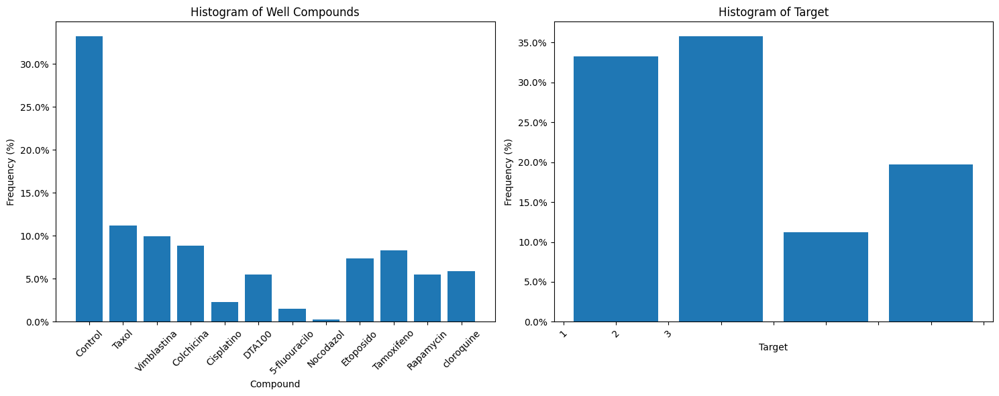

In [25]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import PercentFormatter

# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 6))  # 2 rows, 1 column

# Plot histogram for 'Well Compounds'
unique_compounds = df_all['Compound'].unique()
counts = df_all['Compound'].value_counts(normalize=True)
axs[0].bar(unique_compounds, counts[unique_compounds])
axs[0].set_xticklabels(unique_compounds, rotation=45)  # Set categorical names with rotation
axs[0].yaxis.set_major_formatter(PercentFormatter(1))
axs[0].set_xlabel('Compound')
axs[0].set_ylabel('Frequency (%)')
axs[0].set_title('Histogram of Well Compounds')

# Plot histogram for 'Target'
unique_targets = df_all['Target'].unique()
counts = df_all['Target'].value_counts(normalize=True)
axs[1].bar(unique_targets, counts[unique_targets])
axs[1].set_xticklabels(unique_targets, rotation=45)  # Set categorical names with rotation
axs[1].yaxis.set_major_formatter(PercentFormatter(1))
axs[1].set_xlabel('Target')
axs[1].set_ylabel('Frequency (%)')
axs[1].set_title('Histogram of Target')

# Adjust layout
plt.tight_layout()
plt.show()


XXX tenemos muy pocos datos con DNA, comentar esto

## See the correlation between the data

It seems like there are equal data and repeated series, so we make the correlation between all the series we have (each Well in each csv)

XXX Pendiente de hacer un análisis de corralacion fino con sus test estadisiticos?

In [26]:
# Este grafico esta muy bien pero me molaría vir si son estadisticamente diferentes (la media)
col = "Area [um^2]"
df_list = []
for metric in metrics:
    file = f'data/metrics_{metric}.csv'
    df = pd.read_csv(file)
    # List of DataFrames
    for x in df['Well'].unique():
        df_list.append(pd.DataFrame({str(metric)+x: df[df['Well']==x][col].values}))

# Concatenate the DataFrames along columns (axis=1)
result_df = pd.concat(df_list, axis=1)

result_df

,1A1,1A2,1B1,1B2,2A1,2A2,2B1,3A1,3A2,3B1,...,16B1,16B2,19A1,19A2,19B1,19B2,20A1,20A2,20B1,20B2
0,471.48,194.16,194.16,1200.72,398.68,702.84,1342.40,521.60,991.80,396.84,...,1038.88,148.40,265.56,208.24,423.12,200.36,237.88,657.44,330.60,281.80
1,408.56,483.40,175.20,558.24,314.44,537.80,323.76,891.24,433.24,298.32,...,951.24,395.56,886.88,175.36,378.28,222.52,223.64,223.24,243.08,352.64
2,737.20,237.84,433.76,600.00,482.76,682.12,1003.92,665.40,352.56,445.32,...,194.40,1009.44,803.44,248.28,377.00,245.48,382.36,408.48,249.76,616.20
3,495.96,318.00,244.24,983.60,450.88,754.64,933.48,1008.92,617.52,428.88,...,289.16,339.24,438.12,298.76,577.92,245.16,473.88,623.72,163.80,430.84
4,483.96,501.68,189.88,824.96,697.00,882.32,790.12,983.24,721.24,522.00,...,637.28,262.60,441.24,503.00,208.52,258.08,333.68,412.20,507.08,658.68
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59401,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59402,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59403,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Compute the correlation matrix for each metric and each compound (each experiment)

In [27]:
measures = list(df.columns)
measures.remove('Well')
measures.remove('Cycle')
measures.remove('Time')
measures.remove('Object Index')

In [28]:
def print_pais_of_correlations(corr_df):
    flat_dict = {}
    for key,sub_dict in corr_df.to_dict().items():
        for x,value in sub_dict.items():
            flat_dict[key+'-'+x]=value
    return flat_dict

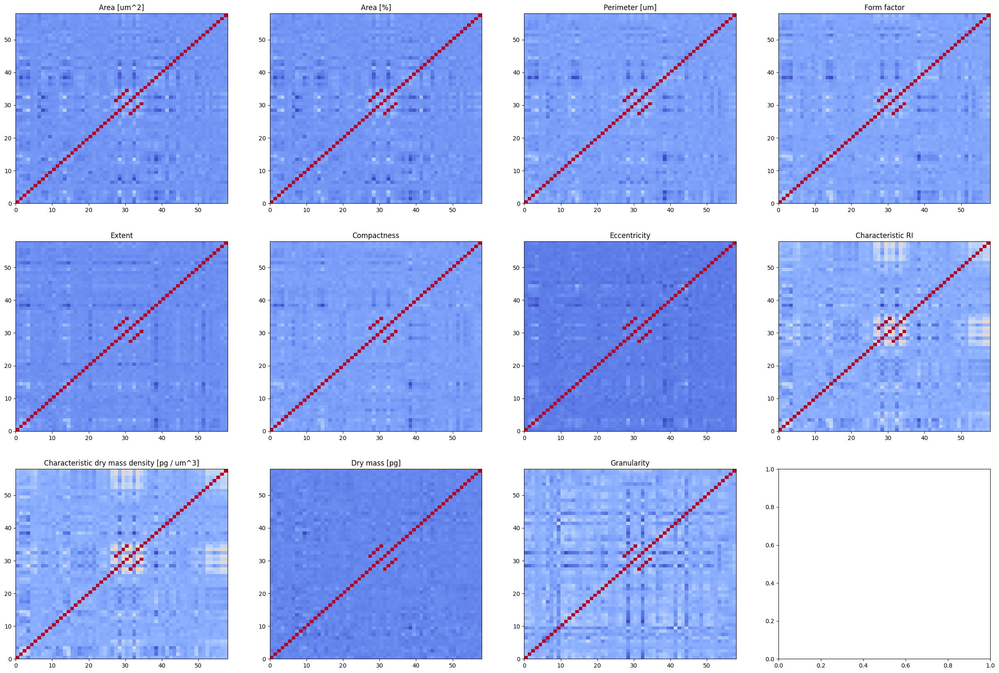

In [29]:

fig, axs = plt.subplots(len(measures)//4+1, 4, figsize=(30,20))
dict_correlations = {}
for i_measeure,measure in enumerate(measures):
    row_ = i_measeure//4
    col_ = np.mod(i_measeure,4)

    df_list = []
    for metric in metrics:
        file = f'data/metrics_{metric}.csv'
        df = pd.read_csv(file)
        # List of DataFrames
        for x in df['Well'].unique():
            df_list.append(pd.DataFrame({str(metric)+x: df[df['Well']==x][measure].values}))

    # Concatenate the DataFrames along columns (axis=1)
    result_df = pd.concat(df_list, axis=1)
    corr_df = result_df.corr()
    dict_correlations[measure] = print_pais_of_correlations(corr_df)
    axs[row_,col_].pcolor(corr_df, cmap='coolwarm')
    axs[row_,col_].set_title(measure)
plt.show()

The data that has a correlation of 1 are copied data. We see that the average correlation is 0, this is good because we can extract information from all the parameters

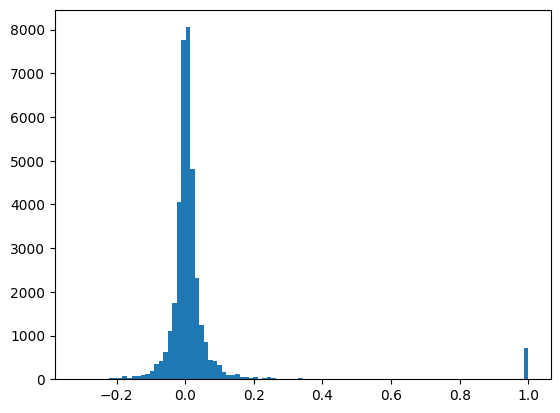

In [30]:
list_corr = []
for k,v in dict_correlations.items():
    for k,corr in v.items():
        list_corr.append(corr)
plt.hist(list_corr, bins=100)
plt.show()

In [31]:
# Function to calculate p-values for each pair of columns
def calculate_p_values(dataframe,alpha = 0.05):
    p_values = np.ones((len(dataframe.columns), len(dataframe.columns)))
    t_statistics = np.ones((len(dataframe.columns), len(dataframe.columns)))

    for i in range(len(dataframe.columns)):
        for j in range(i+1, len(dataframe.columns)):
            column1 = dataframe.columns[i]
            column2 = dataframe.columns[j]
            df_clean = dataframe[[column1,column2]].dropna()

            t_statistic, p_value = ttest_ind(df_clean[column1], df_clean[column2])
            #if p_value < alpha:
            p_values[i, j] = p_value
            p_values[j, i] = p_value
            t_statistics[i, j] = t_statistic
            t_statistics[j, i] = t_statistic

    return p_values,t_statistics

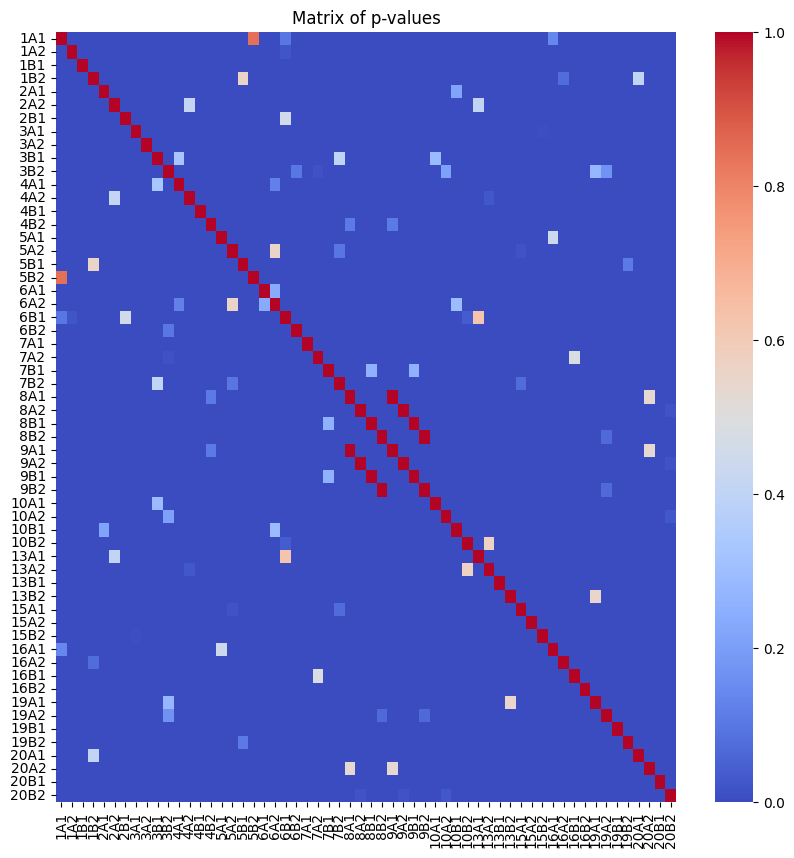

In [32]:
(p_values_matrix , t_statistics_matrix) = calculate_p_values(result_df)

# Create a heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(p_values_matrix, cmap='coolwarm', xticklabels=result_df.columns, yticklabels=result_df.columns)
plt.title('Matrix of p-values')
plt.show()

XXX Preguntar:
1) si al la celula calsificada como 1 en el cycle 1 va a 1 en cycle 2, porque estoy multiplicaría por 40 la muestra y haría el modelo mucho más robusto y con menos necesidad de sacar los datos nuevos (que hacemos con las que se mueren o reproducen?)